# Práctica Final - Propedéutico Maestría Ciencia de Datos

Los datos que analizamos vienen de la página de la Comisión de Taxis y Limosinas de NYC. Nosotros analizamos la información de los taxis verdes de NYC (hay verdes y amarillos) para el año 2019, dividiéndonos el trabajo por cuatrimestre. En este notebook exploraré la visualización de insights apoyandome con los datos geoespaciales de las zonas de NYC.

In [45]:
library(ggplot2)
library(ggmap)
library(RColorBrewer)
library(rgdal)
library(dplyr)
library(tidyverse)
library(broom)

## Lectura del dataset y limpieza 

In [2]:
df_may <- read.csv("https://s3.amazonaws.com/nyc-tlc/trip+data/green_tripdata_2019-05.csv")
df_jun <- read.csv("https://s3.amazonaws.com/nyc-tlc/trip+data/green_tripdata_2019-06.csv")
df_jul <- read.csv("https://s3.amazonaws.com/nyc-tlc/trip+data/green_tripdata_2019-07.csv")
df_ago <- read.csv("https://s3.amazonaws.com/nyc-tlc/trip+data/green_tripdata_2019-08.csv")

In [3]:
df <- rbind(df_may,df_jun,df_jul,df_ago)

In [4]:
head(df,3)

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
,<int>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>
1,1,2019-05-01 00:48:55,2019-05-01 00:55:07,N,1,41,42,1,1.50,7.5,0.0,0.5,0.0,0,NA,0.3,8.3,2,1,0
2,2,2019-05-01 00:53:04,2019-05-01 01:09:10,N,1,25,188,5,3.56,14.5,0.5,0.5,4.2,0,NA,0.3,20.0,1,1,0
3,2,2019-05-01 00:34:24,2019-05-01 00:46:36,N,1,37,198,1,2.23,10.0,0.5,0.5,0.0,0,NA,0.3,11.3,2,1,0


In [5]:
dim(df)

[1] 1896377      20

Sección de datos tomada del código de limpeza de datos de EnriqueOrtiz27

In [6]:
df %>% summarise_all(~ sum(is.na(.)))

VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
87789,0,0,0,87789,0,0,87789,0,0,0,0,0,0,1896023,0,0,87789,88144,87789


In [7]:
clean_dataframe <- function(data_frame) {
    #function to remove unnecessary cols in r dataframe and na's
    data_frame$VendorID <- NULL
    data_frame$store_and_fwd_flag <- NULL
    data_frame$RatecodeID <- NULL
    data_frame$ehail_fee <- NULL
    data_frame$improvement_surcharge <- NULL 
    data_frame$tolls_amount <- NULL 
    data_frame$mta_tax <- NULL 
    data_frame$extra <- NULL 
    data_frame$congestion_surcharge <- NULL
    return(data_frame[complete.cases(data_frame),])
}

In [8]:
df <- clean_dataframe(df)

In [9]:
dim(df)

[1] 1808233      11

In [10]:
df %>% summarise_all(~ sum(is.na(.)))

lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,tip_amount,total_amount,payment_type,trip_type
<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
0,0,0,0,0,0,0,0,0,0,0


In [11]:
str(df)

'data.frame':	1808233 obs. of  11 variables:
 $ lpep_pickup_datetime : chr  "2019-05-01 00:48:55" "2019-05-01 00:53:04" "2019-05-01 00:34:24" "2019-05-01 00:42:50" ...
 $ lpep_dropoff_datetime: chr  "2019-05-01 00:55:07" "2019-05-01 01:09:10" "2019-05-01 00:46:36" "2019-05-01 00:49:20" ...
 $ PULocationID         : int  41 25 37 181 7 179 65 41 7 167 ...
 $ DOLocationID         : int  42 188 198 49 179 173 239 75 82 69 ...
 $ passenger_count      : int  1 5 1 1 1 1 1 1 1 1 ...
 $ trip_distance        : num  1.5 3.56 2.23 1.7 0.6 4.4 8.8 0.79 2.8 2.09 ...
 $ fare_amount          : num  7.5 14.5 10 7.5 4.5 17 28 5.5 11.5 10.5 ...
 $ tip_amount           : num  0 4.2 0 1 1.7 0 5.86 2.04 1.2 0 ...
 $ total_amount         : num  8.3 20 11.3 9.8 7.5 ...
 $ payment_type         : int  2 1 2 1 1 2 1 1 1 2 ...
 $ trip_type            : int  1 1 1 1 1 1 1 1 1 1 ...


In [12]:
df$lpep_dropoff_datetime <- as.POSIXct(df$lpep_dropoff_datetime,format='%Y-%m-%d %H:%M:%S')
df$lpep_pickup_datetime <- as.POSIXct(df$lpep_pickup_datetime,format='%Y-%m-%d %H:%M:%S')

In [13]:
df$trip_duration <- as.numeric(difftime(df$lpep_dropoff_datetime, df$lpep_pickup_datetime, units="mins"))

In [14]:
summary(df)

 lpep_pickup_datetime          lpep_dropoff_datetime          PULocationID  
 Min.   :2008-12-31 22:57:55   Min.   :2008-12-31 23:07:00   Min.   :  1.0  
 1st Qu.:2019-05-28 19:01:08   1st Qu.:2019-05-28 19:15:48   1st Qu.: 52.0  
 Median :2019-06-26 13:36:37   Median :2019-06-26 13:59:13   Median : 82.0  
 Mean   :2019-06-28 06:23:11   Mean   :2019-06-28 06:44:03   Mean   :106.9  
 3rd Qu.:2019-07-27 23:55:36   3rd Qu.:2019-07-28 00:12:43   3rd Qu.:165.0  
 Max.   :2062-08-15 00:00:00   Max.   :2062-08-15 16:34:10   Max.   :265.0  
  DOLocationID   passenger_count trip_distance     fare_amount     
 Min.   :  1.0   Min.   :0.000   Min.   :  0.00   Min.   :-350.00  
 1st Qu.: 65.0   1st Qu.:1.000   1st Qu.:  1.03   1st Qu.:   6.50  
 Median :129.0   Median :1.000   Median :  1.83   Median :   9.50  
 Mean   :129.6   Mean   :1.309   Mean   :  2.93   Mean   :  13.17  
 3rd Qu.:193.0   3rd Qu.:1.000   3rd Qu.:  3.45   3rd Qu.:  15.50  
 Max.   :265.0   Max.   :9.000   Max.   :202.10   Max

In [15]:
summary(df[-which(df$fare_amount < 1),])

 lpep_pickup_datetime          lpep_dropoff_datetime          PULocationID  
 Min.   :2008-12-31 22:57:55   Min.   :2008-12-31 23:07:00   Min.   :  1.0  
 1st Qu.:2019-05-28 18:55:27   1st Qu.:2019-05-28 19:09:08   1st Qu.: 52.0  
 Median :2019-06-26 13:16:55   Median :2019-06-26 13:40:27   Median : 82.0  
 Mean   :2019-06-28 06:08:19   Mean   :2019-06-28 06:29:14   Mean   :106.7  
 3rd Qu.:2019-07-27 23:37:53   3rd Qu.:2019-07-27 23:58:46   3rd Qu.:160.0  
 Max.   :2062-08-15 00:00:00   Max.   :2062-08-15 16:34:10   Max.   :265.0  
  DOLocationID   passenger_count trip_distance      fare_amount     
 Min.   :  1.0   Min.   :0.000   Min.   :  0.000   Min.   :   1.00  
 1st Qu.: 65.0   1st Qu.:1.000   1st Qu.:  1.040   1st Qu.:   6.50  
 Median :129.0   Median :1.000   Median :  1.830   Median :  10.00  
 Mean   :129.5   Mean   :1.309   Mean   :  2.937   Mean   :  13.26  
 3rd Qu.:193.0   3rd Qu.:1.000   3rd Qu.:  3.450   3rd Qu.:  15.50  
 Max.   :265.0   Max.   :9.000   Max.   :202.10

In [16]:
df <- df[-which(df$fare_amount < 1),]
df <- df[-which(df$trip_duration < 1),]

In [17]:
summary(df)

 lpep_pickup_datetime          lpep_dropoff_datetime          PULocationID  
 Min.   :2008-12-31 22:57:55   Min.   :2008-12-31 23:07:00   Min.   :  1.0  
 1st Qu.:2019-05-28 18:19:06   1st Qu.:2019-05-28 18:35:20   1st Qu.: 52.0  
 Median :2019-06-26 11:49:29   Median :2019-06-26 12:13:39   Median : 82.0  
 Mean   :2019-06-28 04:59:44   Mean   :2019-06-28 05:21:15   Mean   :106.3  
 3rd Qu.:2019-07-27 22:28:36   3rd Qu.:2019-07-27 22:49:12   3rd Qu.:159.0  
 Max.   :2062-08-15 00:00:00   Max.   :2062-08-15 16:34:10   Max.   :265.0  
  DOLocationID   passenger_count trip_distance      fare_amount     
 Min.   :  1.0   Min.   :0.00    Min.   :  0.000   Min.   :   1.00  
 1st Qu.: 65.0   1st Qu.:1.00    1st Qu.:  1.080   1st Qu.:   6.50  
 Median :129.0   Median :1.00    Median :  1.870   Median :  10.00  
 Mean   :129.1   Mean   :1.31    Mean   :  2.985   Mean   :  13.23  
 3rd Qu.:192.0   3rd Qu.:1.00    3rd Qu.:  3.500   3rd Qu.:  15.50  
 Max.   :265.0   Max.   :9.00    Max.   :202.10

## Mapeo de los datos de viajes

In [18]:
shp <- readOGR(dsn = "shape/taxi_zones.shp",verbose = F)

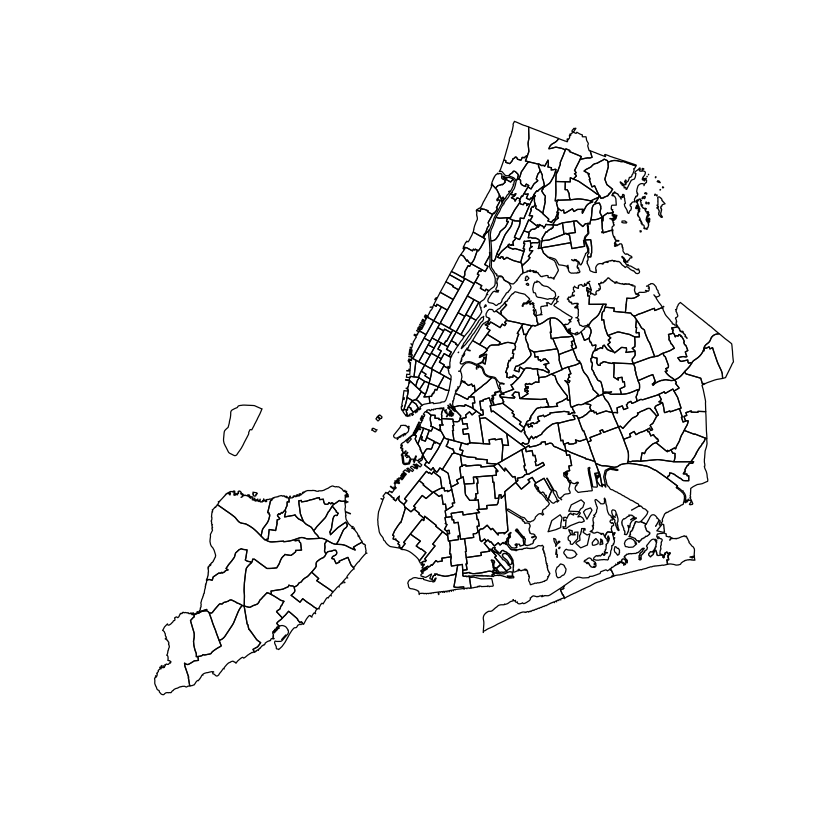

In [19]:
plot(shp)

### Versión ggplot

In [20]:
nyc_zones_df <- tidy(spTransform(shp, CRS("+proj=longlat +datum=WGS84")),)

Regions defined for each Polygons



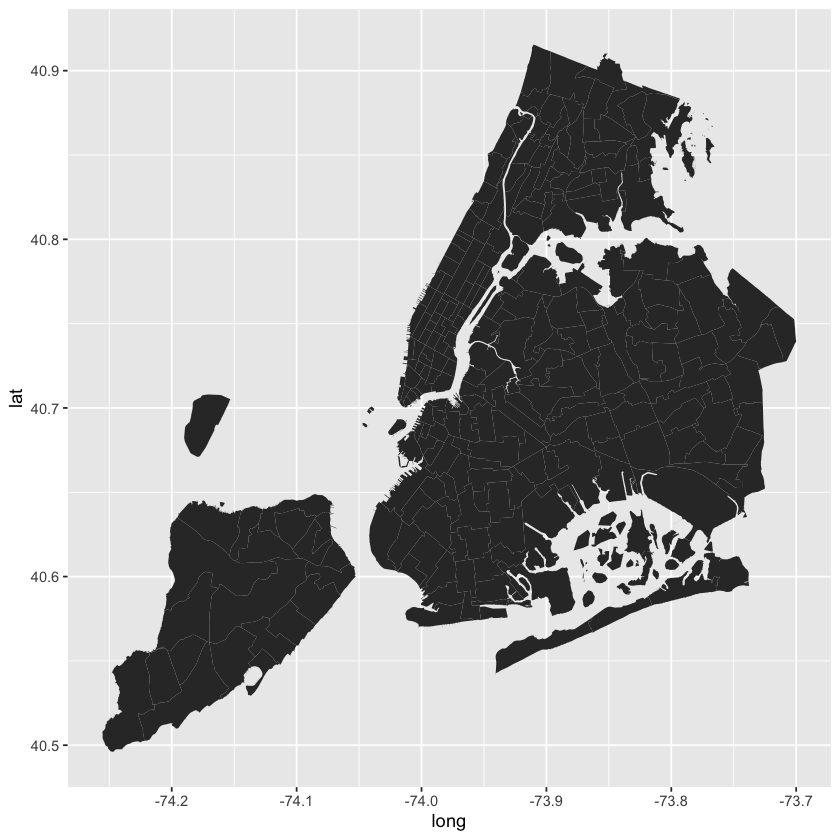

In [21]:
ggplot() + 
  geom_polygon(data=nyc_zones_df, aes(x=long, y=lat, group=group))

### Versión ggplot + ggmap

In [22]:
loglat_matrix <- coordinates(spTransform(shp, CRS("+proj=longlat +datum=WGS84")))

In [23]:
df_shape <- data.frame(shp$LocationID,shp$zone,shp$borough,loglat_matrix[,1],loglat_matrix[,2])
colnames(df_shape) <- c("PULocationID", "zone","borough","long","lat")

In [24]:
head(df_shape,3)

,PULocationID,zone,borough,long,lat
,<int>,<chr>,<chr>,<dbl>,<dbl>
0,1,Newark Airport,EWR,-74.17400,40.69183
1,2,Jamaica Bay,Queens,-73.82648,40.62420
2,3,Allerton/Pelham Gardens,Bronx,-73.84742,40.86447


In [43]:
ny <- get_map(c(left = min(df_shape$long)-0.01, bottom = min(df_shape$lat)-0.01, 
                right = max(df_shape$long)+0.01, top = max(df_shape$lat)+0.01))

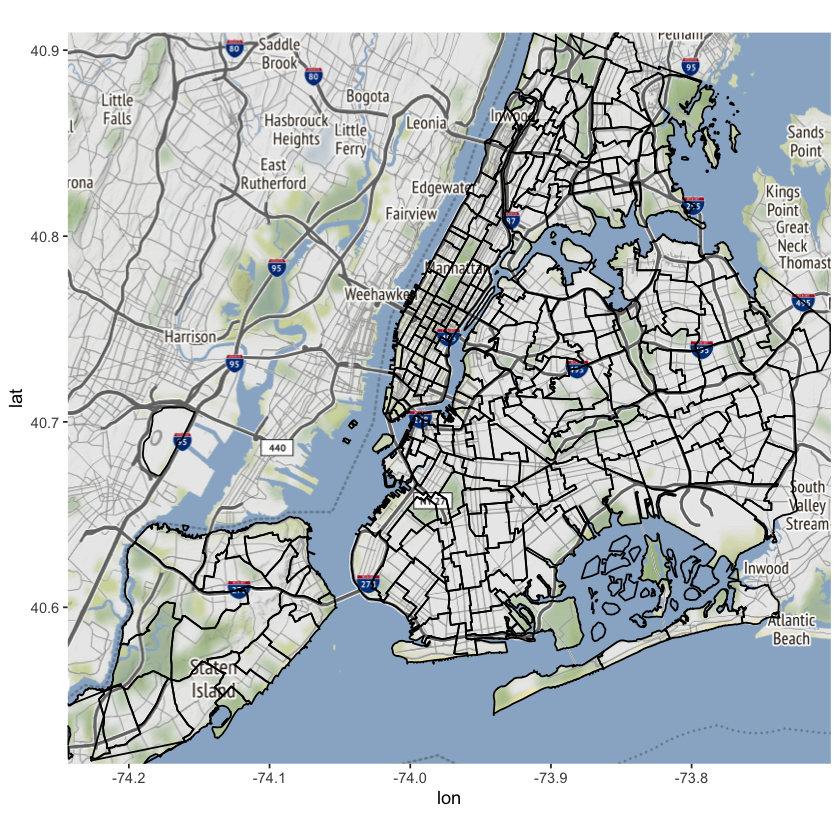

In [26]:
ggmap(ny) + geom_polygon(data=nyc_zones_df, aes(x=long, y=lat, group=group), color="black", fill=NA)

In [27]:
df_count <- df %>% count(PULocationID)

In [28]:
df_means <- df %>% group_by(PULocationID) %>% summarise(fare_amount = mean(fare_amount),tip_amount = mean(tip_amount),trip_duration = mean(trip_duration))

`summarise()` ungrouping output (override with `.groups` argument)



In [29]:
df_stats <- merge(x = df_count, y = df_means, by = "PULocationID", all.x = TRUE)

In [30]:
df_taxi_stats <- merge(df_stats,df_shape, by = "PULocationID", all.x = TRUE)

In [31]:
head(df_taxi_stats,3)

,PULocationID,n,fare_amount,tip_amount,trip_duration,zone,borough,long,lat
,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>
1,1,7,76.00000,9.4728571,26.02619,Newark Airport,EWR,-74.17400,40.69183
2,2,14,38.74286,0.0000000,22.14167,Jamaica Bay,Queens,-73.82648,40.62420
3,3,1079,19.77357,0.1206487,32.13957,Allerton/Pelham Gardens,Bronx,-73.84742,40.86447


In [32]:
myPalette = colorRampPalette(rev(brewer.pal(11, "Spectral")))

In [33]:
options(repr.plot.width = 15, repr.plot.height = 7) #this line is not necessary to execute in R, is just
                                                   #to have a smaller plot because we're using the kernel of R
                                                   #in jupyterlab

Warning message:
“Removed 3 rows containing missing values (geom_point).”


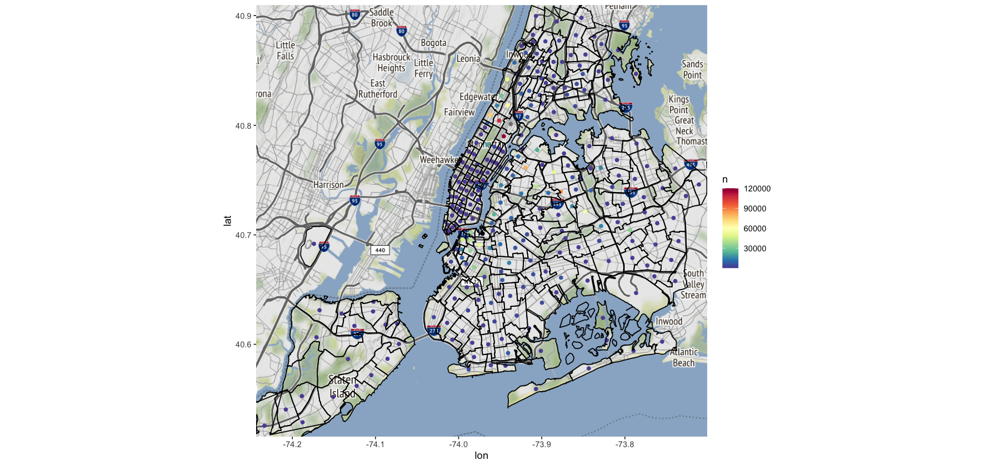

In [34]:
sc = scale_colour_gradientn(colours = myPalette(100), limits=c(1,120000))
ggmap(ny) + geom_point(aes(x = long, y = lat, colour = n),data = df_taxi_stats)+
geom_polygon(data=nyc_zones_df, aes(x=long, y=lat, group=group), color="black", fill=NA) + sc

Warning message:
“Removed 3 rows containing missing values (geom_point).”


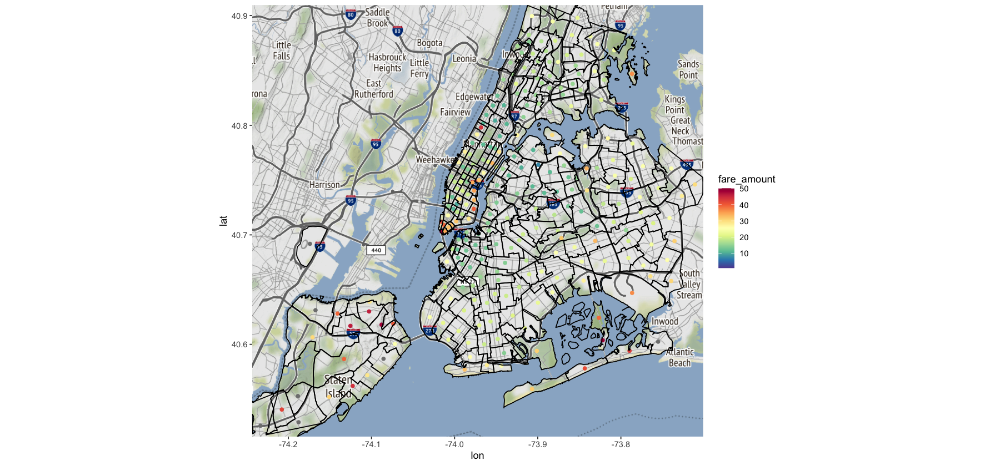

In [35]:
sc = scale_colour_gradientn(colours = myPalette(100), limits=c(1,50))
ggmap(ny) + geom_point(aes(x = long, y = lat, colour = fare_amount),data = df_taxi_stats)+
geom_polygon(data=nyc_zones_df, aes(x=long, y=lat, group=group), color="black", fill=NA) + sc

Warning message:
“Removed 3 rows containing missing values (geom_point).”


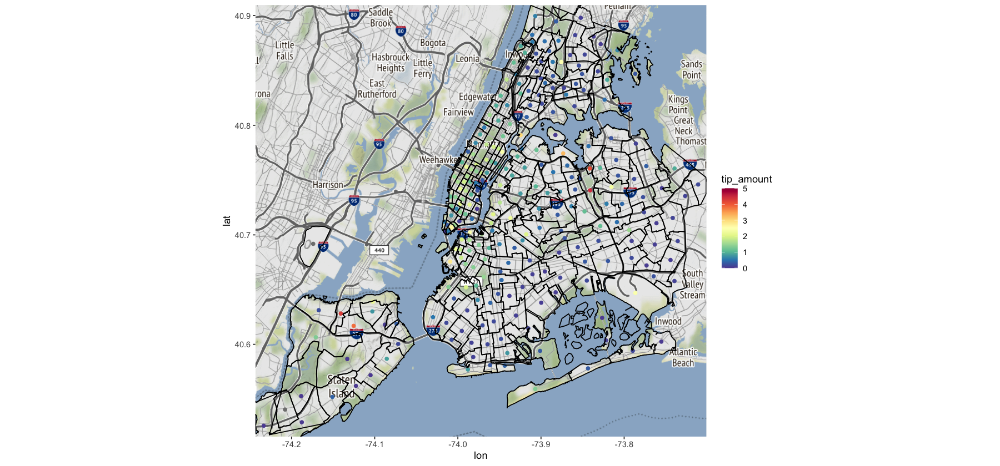

In [36]:
sc = scale_colour_gradientn(colours = myPalette(100), limits=c(0,5))
ggmap(ny) + geom_point(aes(x = long, y = lat, colour = tip_amount),data = df_taxi_stats)+
geom_polygon(data=nyc_zones_df, aes(x=long, y=lat, group=group), color="black", fill=NA) + sc

Warning message:
“Removed 3 rows containing missing values (geom_point).”


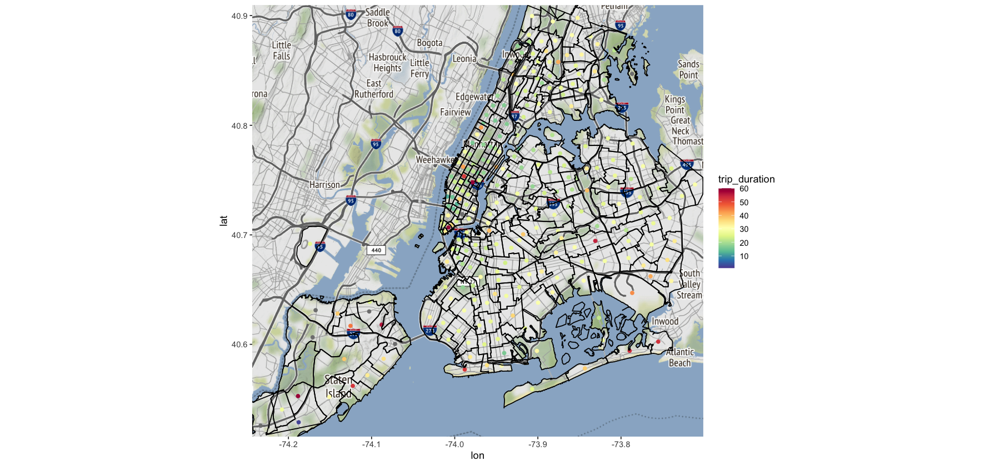

In [37]:
sc = scale_colour_gradientn(colours = myPalette(100), limits=c(1,60))
ggmap(ny) + geom_point(aes(x = long, y = lat, colour = trip_duration),data = df_taxi_stats)+
geom_polygon(data=nyc_zones_df, aes(x=long, y=lat, group=group), color="black", fill=NA) + sc

## Manhattan

In [44]:
df_taxi_stats_mh <- subset(df_taxi_stats, borough == 'Manhattan')
df_shape_mh <- subset(df_shape, borough == 'Manhattan')
ny_mh <- get_map(c(left = min(df_shape_mh$long)-0.01, bottom = min(df_shape_mh$lat)-0.01, 
                right = max(df_shape_mh$long)+0.01, top = max(df_shape_mh$lat)+0.01))

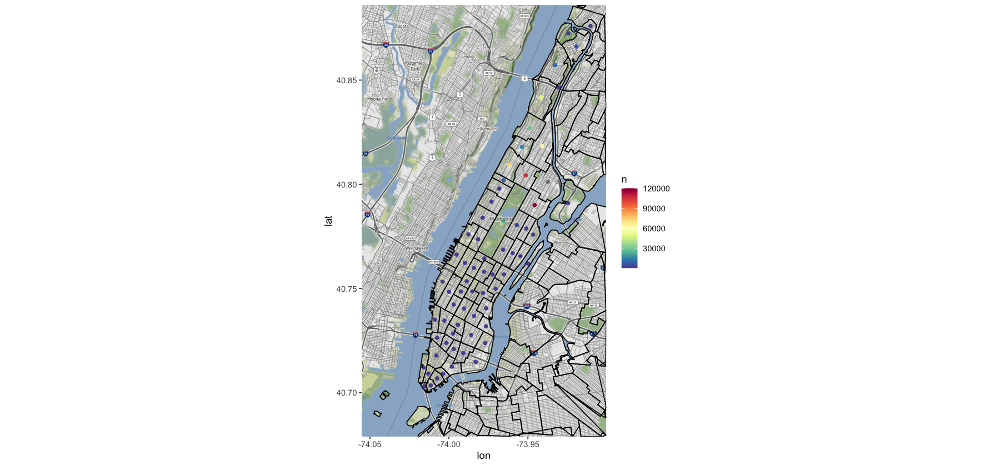

In [39]:
sc = scale_colour_gradientn(colours = myPalette(100), limits=c(1,120000))
ggmap(ny_mh) + geom_point(aes(x = long, y = lat, colour = n),data = df_taxi_stats_mh)+
geom_polygon(data=nyc_zones_df, aes(x=long, y=lat, group=group), color="black", fill=NA) + sc

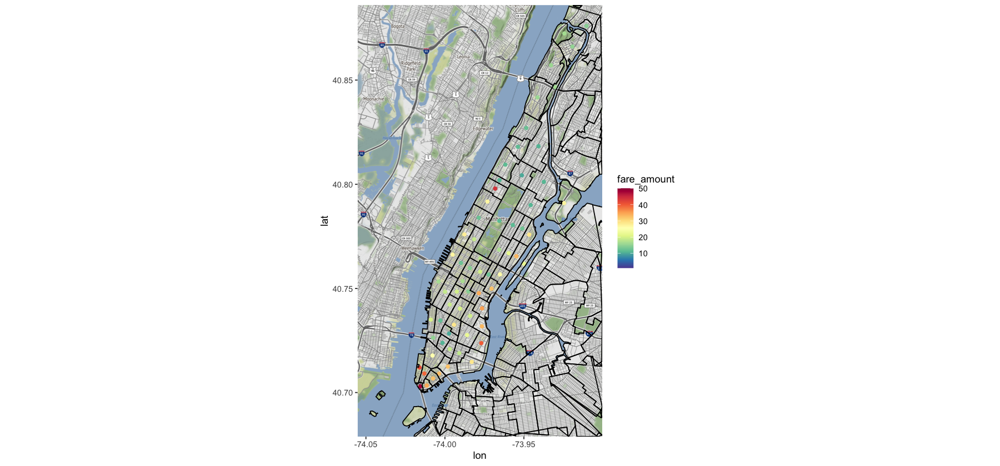

In [40]:
sc = scale_colour_gradientn(colours = myPalette(100), limits=c(1,50))
ggmap(ny_mh) + geom_point(aes(x = long, y = lat, colour = fare_amount),data = df_taxi_stats_mh)+
geom_polygon(data=nyc_zones_df, aes(x=long, y=lat, group=group), color="black", fill=NA) + sc

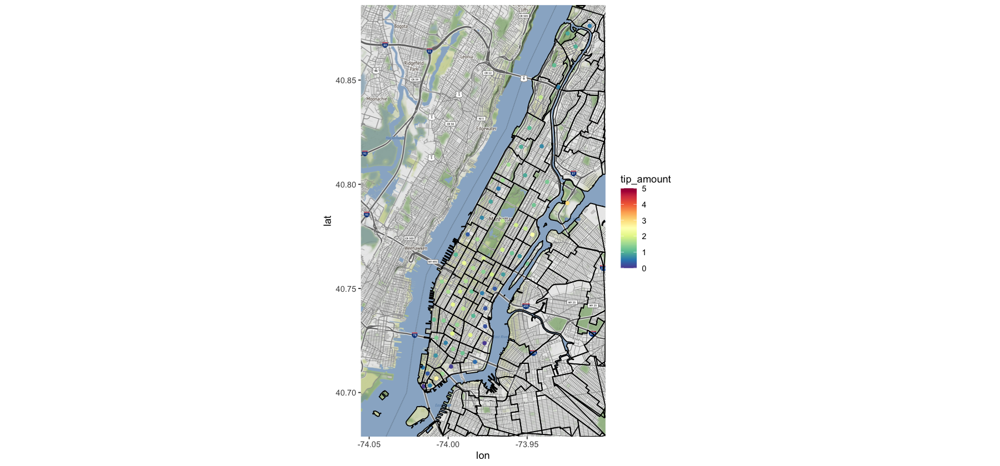

In [41]:
sc = scale_colour_gradientn(colours = myPalette(100), limits=c(0,5))
ggmap(ny_mh) + geom_point(aes(x = long, y = lat, colour = tip_amount),data = df_taxi_stats_mh)+
geom_polygon(data=nyc_zones_df, aes(x=long, y=lat, group=group), color="black", fill=NA) + sc

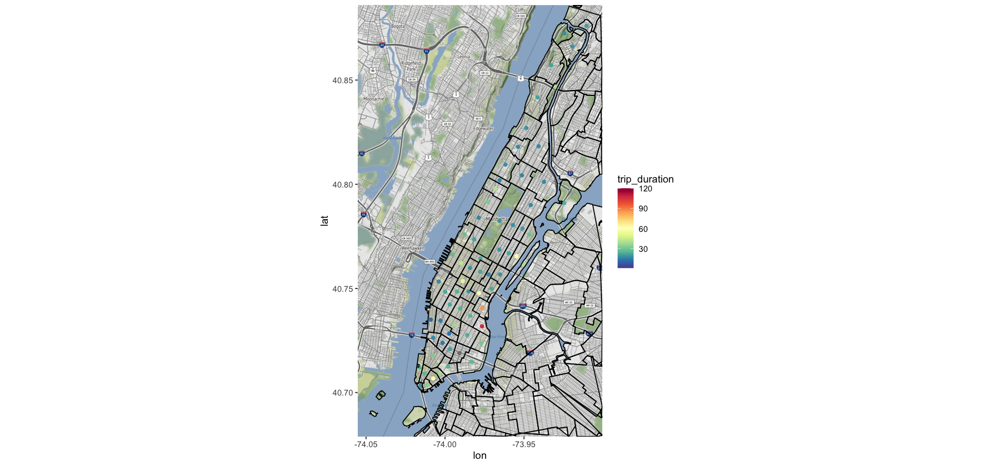

In [42]:
sc = scale_colour_gradientn(colours = myPalette(100), limits=c(1,120))
ggmap(ny_mh) + geom_point(aes(x = long, y = lat, colour = trip_duration),data = df_taxi_stats_mh)+
geom_polygon(data=nyc_zones_df, aes(x=long, y=lat, group=group), color="black", fill=NA) + sc